# Cellrank with time series dataset (WOT) on Epithelial compartment with focus on alveolar differentiation

In [1]:
import sys
import matplotlib.pyplot as plt
import scvelo as scv
import scanpy as sc
import cellrank as cr
import pandas as pd
from matplotlib import cm
from cellrank.kernels import RealTimeKernel
from cellrank.kernels import ConnectivityKernel

# set verbosity levels
cr.settings.verbosity = 2
scv.settings.verbosity = 3

# figure settings
scv.settings.set_figure_params(
    "scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=12, color_map="viridis"
)

In [19]:
# Load adata object
adata = sc.read_h5ad("/oak/stanford/groups/wjg/skim/projects/LDA/3_trajectories/adata/Epithelial.h5ad")

In [20]:
# Subset to relevant cells only
celltypes = ["TiP1", "TiP2", "AT1l1", "AT1l2","AT1l3","AT2l"]
adata = adata[adata.obs['FineNamedClust'].isin(celltypes)]

In [21]:
# Collapse AT1 cells into one cluster
old_to_new = dict(
    AT1l1='AT1l',
    AT1l2='AT1l',
    AT1l3='AT1l',
    TiP1="TiP1",
    TiP2="TiP2",
    AT2l="AT2l"
)
adata.obs['FineNamedClust'] = (
    adata.obs['FineNamedClust']
    .map(old_to_new)
    .astype('category')
)

/tmp/ipykernel_94469/1370459277.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['FineNamedClust'] = (


In [22]:
# Create a color map fo
cts_colors = {"APr1":"#59A850", "APr2":"#6DC184", "APr3":"#89C75F", "APr4":"#92CDA2", 
              "PNEC1":"#3BBCA8", "PNEC2":"#B4D06F", "PNEC3":"#269691", "eCili":"#9BB734",
             "lCili":"#6A897F", "TiP1":"#97A591", "TiP2":"#675A2A", "AT2l":"#6AC8C5", "AT1l":"#355B59", "EpiC":"#0C727C"}

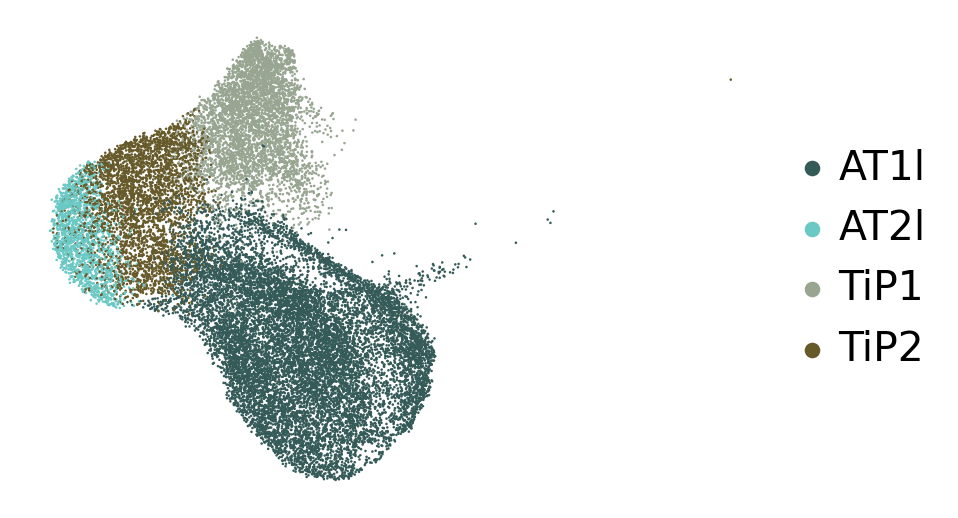

In [23]:
sc.pl.umap(adata, color=['FineNamedClust'],palette=cts_colors, frameon=False, title=['', ''], )

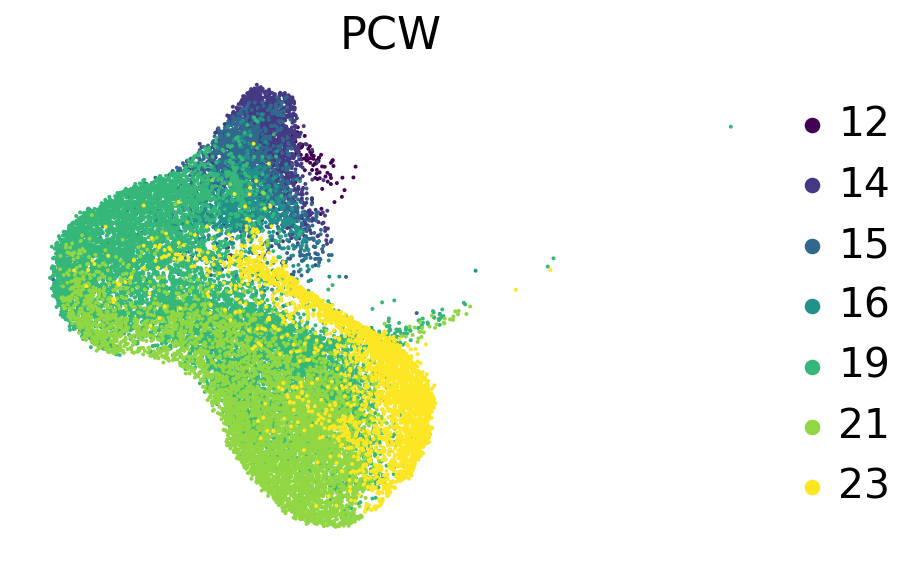

In [24]:
# Using scv plotting to check object
scv.settings.set_figure_params(
    "scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map='viridis'
)

scv.pl.scatter(adata, color="PCW", legend_loc="right", palette="viridis")

In [25]:
# Calculate nearest neighbors
sc.pp.highly_variable_genes(adata, batch_key="Sample")
sc.pp.pca(adata)
sc.pp.neighbors(adata, random_state=0)

In [26]:
# Initialize the WOT kernel
import wot
ot_model=wot.ot.OTModel(adata, day_field="PCW")
ot_model.compute_all_transport_maps(tmap_out="tmaps_subclustered/")

rtk = cr.kernels.RealTimeKernel.from_wot(adata, path = "tmaps_subclustered/", time_key="PCW")
rtk = rtk.compute_transition_matrix()

100%|██████████| 6/6 [00:00<00:00, 60787.01time pair/s]

Using automatic `threshold=0.0008573861571138415`


Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


Simulating `30` random walks of maximum length `500`


100%|██████████| 30/30 [00:05<00:00,  5.57sim/s]


    Finish (0:00:05)
Plotting random walks


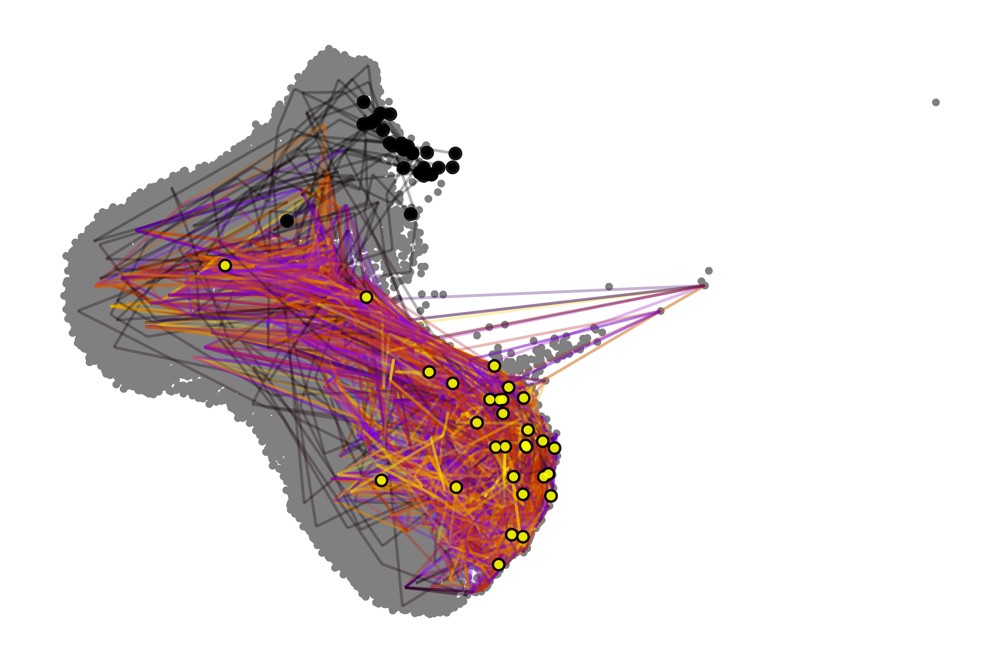

In [27]:
# Visualize recovered dynamics by random walks
rtk.plot_random_walks(
    n_sims=30,
    max_iter=500,
    start_ixs={"PCW": 12},
    basis="umap",
    seed=0,
    size=30,
    dpi=600,
    save="wot_randomwalk_30sims_500iter_fromPCW12_subclustered.svg"
)

Computing flow from `TiP1` into `3` cluster(s) in `6` time points
Plotting flow from `TiP1` into `3` cluster(s) in `6` time points


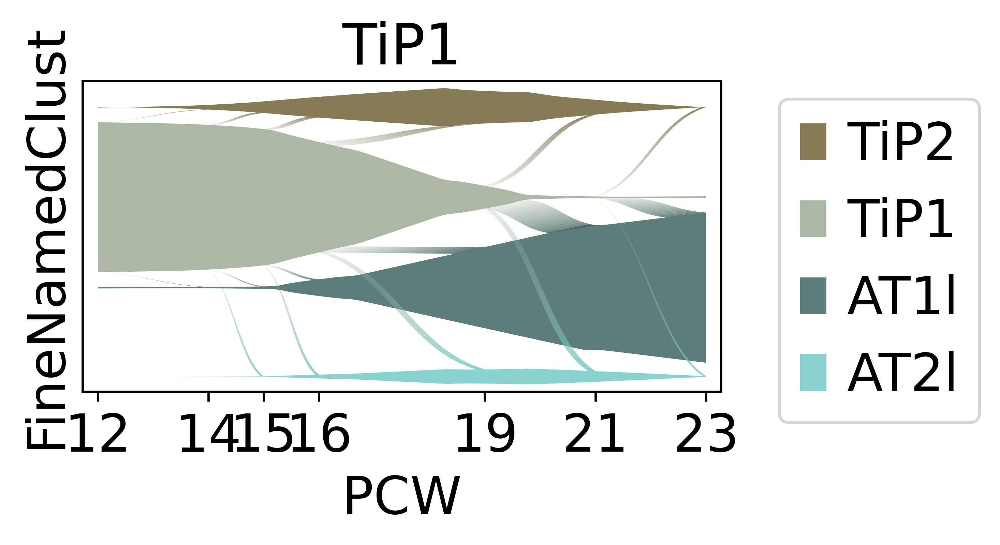

In [28]:
#Probability mass flow in time
ax = rtk.plot_single_flow(
    cluster_key="FineNamedClust",
    time_key="PCW",
    cluster="TiP1",
#    min_flow=0.01,
    xticks_step_size=1,
    dpi=300,
    clusters=["TiP1","TiP2", "AT1l",  "AT2l"],
    figsize=[4,2],
    save="TiP1_PercentMassFlow_AlveolarProgenitors_R2.svg"
)

# prettify the plot a bit, rotate x-axis tick labels
#locs, labels = plt.xticks()
#ax.set_xticks(locs)
#ax.set_xticklabels(labels)

plt.show()


In [77]:
#Compute macrostates

# First add a connectivity matrix (helps with the numerical calculations)
ck = ConnectivityKernel(adata)
ck.compute_transition_matrix()

combined_kernel = 0.9 * rtk + 0.1 * ck

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:04)


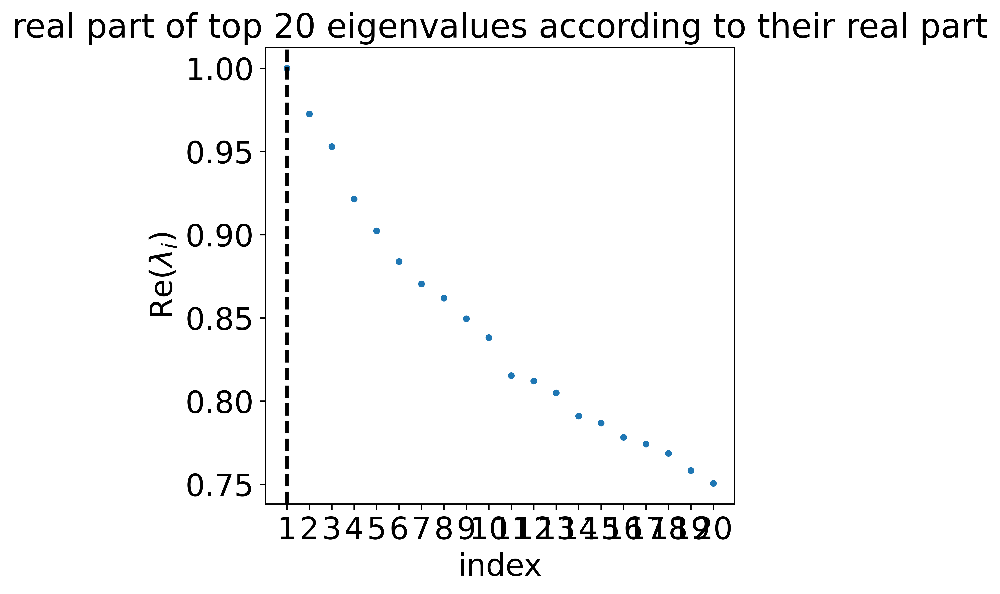

In [78]:
# Initialize GPCCA estimator
g = cr.estimators.GPCCA(combined_kernel)

# Compute and plot Schur decomposition
g.compute_schur()
g.plot_spectrum(real_only=True, dpi= 300, save = "wot_eigengap_subclustered.pdf")

Computing `12` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:44)


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


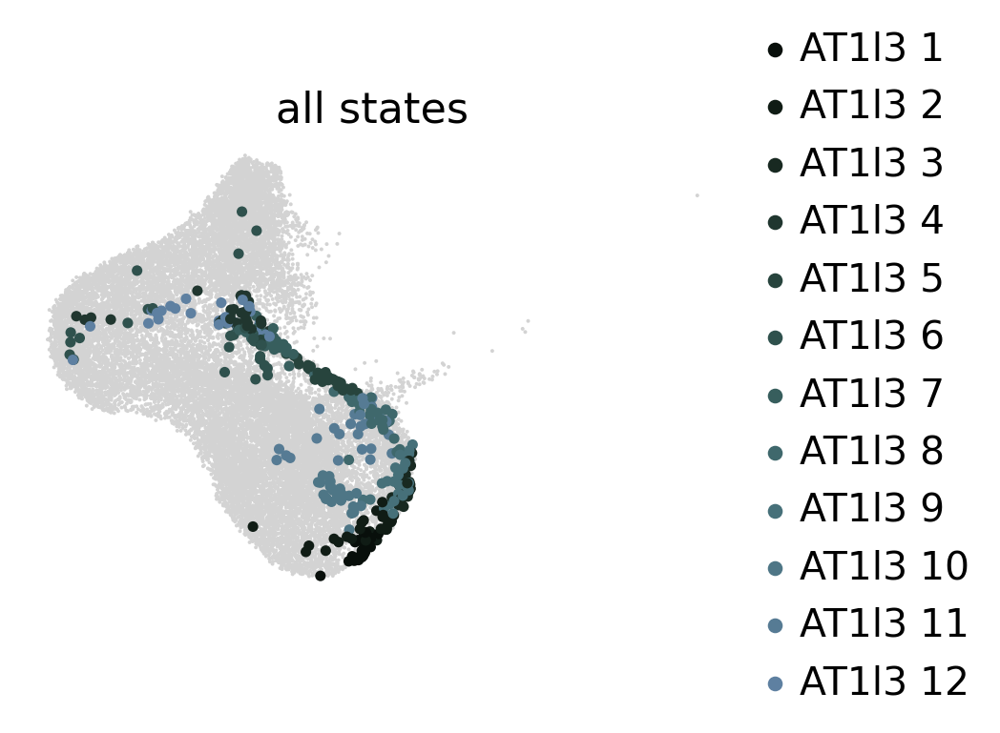

In [72]:
g.compute_macrostates(n_states=12, cluster_key="FineNamedClust")
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


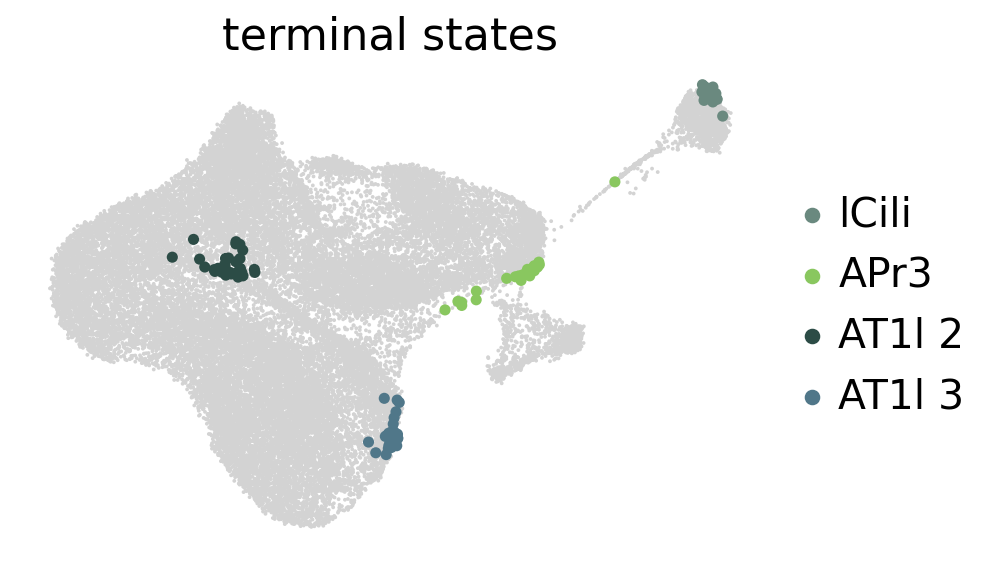

In [44]:
g.predict_terminal_states()
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


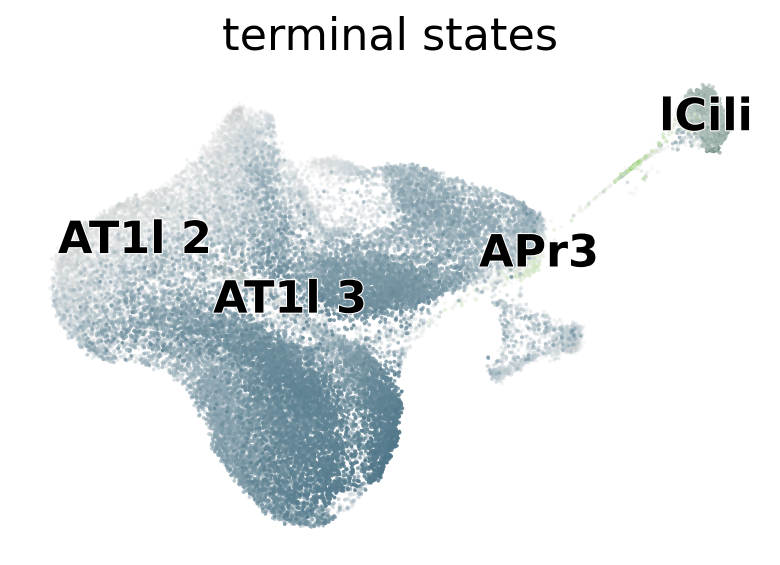

In [45]:
g.plot_macrostates(which="terminal", discrete=False)

In [47]:
# Defining terminal states
g.set_terminal_states(["AT1l", "AT2l", "lCili", "PNEC2", "PNEC3"])

RuntimeError: Compute macrostates first as `.compute_macrostates()`.

In [26]:
# Define initial states
g.set_initial_states(["ePeri"])

KeyError: "Invalid lineage name `'ePeri'`. Valid names are: `['vSMC2', 'vSMC1', 'lPeri_1', 'lPeri_2']`."

In [27]:
# Compute absorption probabilities, probability that an earlier ancestor cell became this descendant cell
g.compute_fate_probabilities(solver="gmres")

Computing fate probabilities


100%|██████████| 3/3 [00:00<00:00,  3.87/s]


Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:01)


saving figure to file ./figures/scvelo_FateProb_UMAP_Macrostates_subclustered.pdf


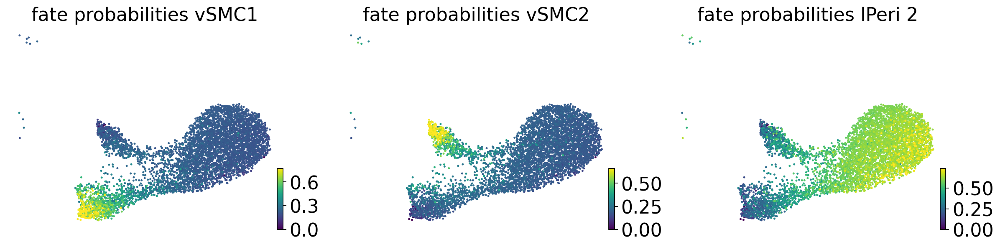

In [28]:
g.plot_fate_probabilities(
    same_plot=False, 
    basis="umap", 
    perc=[0, 99], 
    save="FateProb_UMAP_Macrostates_subclustered.pdf")

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.

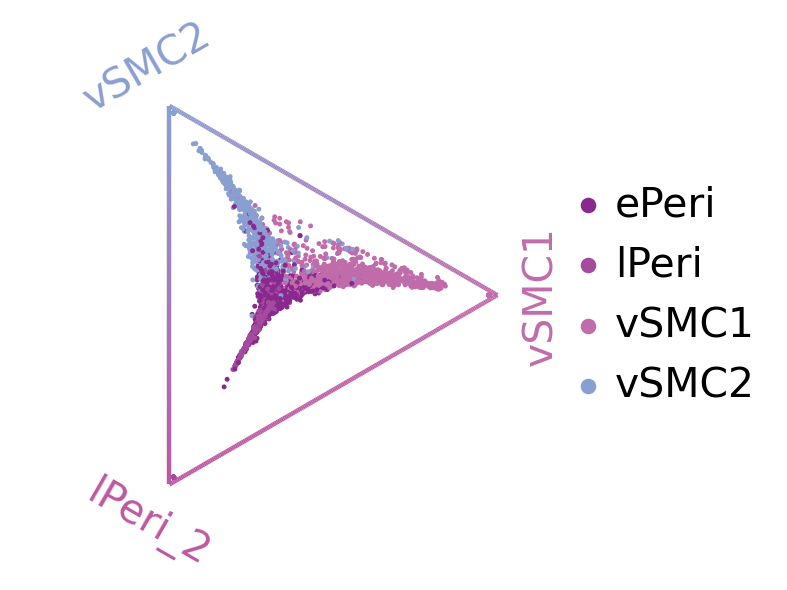

In [29]:
cr.pl.circular_projection(
    adata, 
    keys=["FineNamedClust"], 
    legend_loc="right", 
    title="",
    save="FateProb_CircularProjection_Macrostates_subclustered.pdf",
    fontsize=12
)

In [59]:
adata

AnnData object with n_obs × n_vars = 8897 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'Sample', 'preservation', 'sex', 'age', 'Clusters', 'S.Score', 'G2M.Score', 'Phase', 'BroadClust', 'BroadNamedClust', 'sub.cluster', 'FineClust', 'FineNamedClust', 'RNA_snn_res.0.1', 'RNA_snn_res.0.3', 'PCW', 'macrostates_fwd', 'clusters_gradients', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean expression'
    uns: 'FineNamedClust_colors', 'PCW_colors', 'neighbors', 'hvg', 'schur_matrix_fwd', 'eigendecomposition_fwd', 'macrostates_fwd_colors', 'coarse_fwd', 'clusters_gradients_colors', 'term_states_fwd_colors', 'init_states_fwd_colors', 'paga', 'FineNamedClust_sizes', 'DM_EigenValues'
    obsm: 'X_lsi_iter1', 'X_lsi_iter2', 'X_umap', 'X_pc

In [36]:
term_df = pd.DataFrame(g.terminal_states_probabilities, columns = ["terminal_states_probabilities"])

In [37]:
init_df = pd.DataFrame(g.initial_states_probabilities, columns = ["initial_states_probabilities"])

In [38]:
g.fate_probabilities

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/numpy/core/arrayprint.py:1039: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return dragon4_positional(x,


vSMC1,vSMC2,lPeri_2
0.203291,0.182002,0.614706
0.246874,0.251842,0.501283
0.238753,0.201765,0.559482
0.208154,0.187610,0.604236
0.209900,0.191320,0.598780
0.203032,0.183910,0.613058
0.231810,0.199702,0.568488
0.231832,0.211496,0.556672
0.232254,0.201830,0.565915
0.230754,0.192565,0.576681


In [39]:
fate_df = pd.DataFrame(g.fate_probabilities, columns = ["vSMC1", "vSMC2", "lPeri_2"])

In [40]:
fate_df

,vSMC1,vSMC2,lPeri_2
0,0.203291,0.182002,0.614706
1,0.246874,0.251842,0.501283
2,0.238753,0.201765,0.559482
3,0.208154,0.187610,0.604236
4,0.209900,0.191320,0.598780
...,...,...,...
6149,0.184358,0.166918,0.648725
6150,0.222302,0.197091,0.580607
6151,0.219295,0.513927,0.266778
6152,0.200815,0.179111,0.620073


In [113]:
import numpy as np
target_value = 1/3
abs_diff = np.abs(fate_df.sub(target_value))
best_index = abs_diff.sum(axis=1).idxmin()
print(fate_df.loc[best_index])

lArtr    0.304603
Veno     0.331481
lAero    0.363916
Name: 5881, dtype: float64


In [132]:
term_df["cell_barcodes"] = term_df.index
term_df = term_df.reset_index(drop=True)
print(term_df.loc[best_index])

terminal_states_probabilities                      0.344035
cell_barcodes                    PCW21.D_AACATTGTCATTATGG-1
Name: 5881, dtype: object


In [142]:
# Max initial state probability
init_df.loc[init_df["initial_states_probabilities"].idxmax()]

initial_states_probabilities    1.0
Name: PCW21.P_CTCTAAGCAACTGGCT-1, dtype: float64

In [143]:
term_df.loc[term_df["terminal_states_probabilities"].idxmin()]

terminal_states_probabilities                    0.030816
cell_barcodes                    PCW23_TTGATGTCACAAAGCG-1
Name: 8845, dtype: object

In [151]:
for lineage in fate_df.columns:
    max_index = fate_df[lineage].idxmax()
    print("For ", lineage, term_df.loc[max_index])

For  lArtr terminal_states_probabilities                    0.964008
cell_barcodes                    PCW12_AACCGGCTCTTGAGGT-1
Name: 15, dtype: object
For  Veno terminal_states_probabilities                    0.988347
cell_barcodes                    PCW14_CAGCCAATCGTTCACC-1
Name: 1282, dtype: object
For  lAero terminal_states_probabilities                       0.976881
cell_barcodes                    PCW19.LU_AACAGCAAGACACTTA-1
Name: 3639, dtype: object


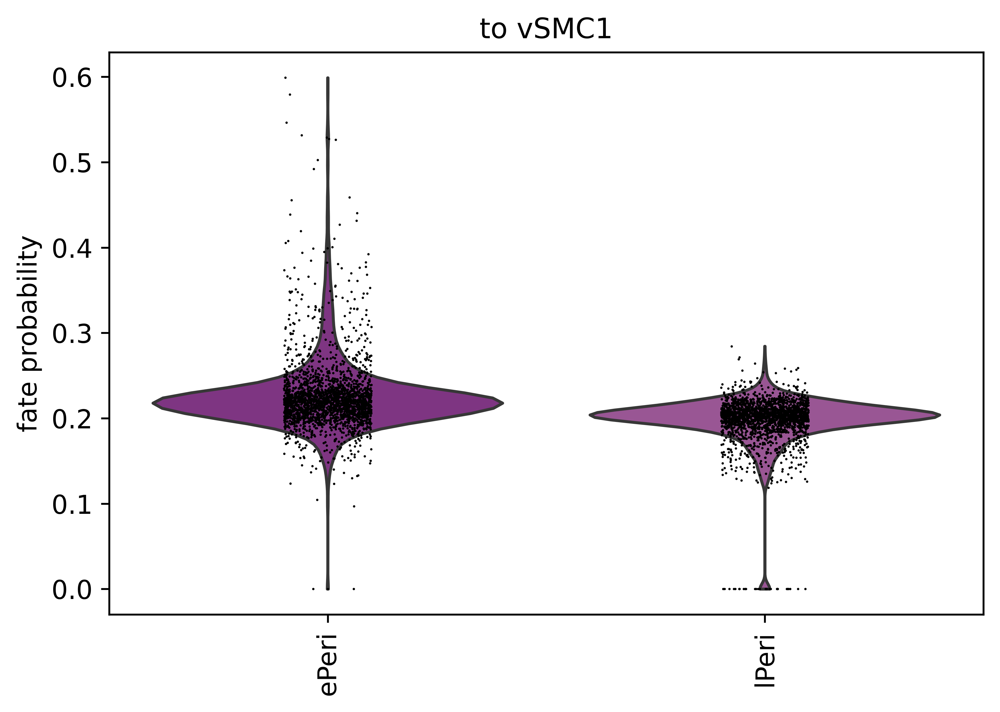

In [43]:
cr.pl.aggregate_fate_probabilities(
    adata, 
    mode="violin", 
    lineages=["vSMC1"],
    cluster_key="FineNamedClust", 
    clusters=["ePeri", "lPeri"],
    dpi=300,
    save="AggregatedFateProb_Violin_vSMC1_subclustered.pdf"
)

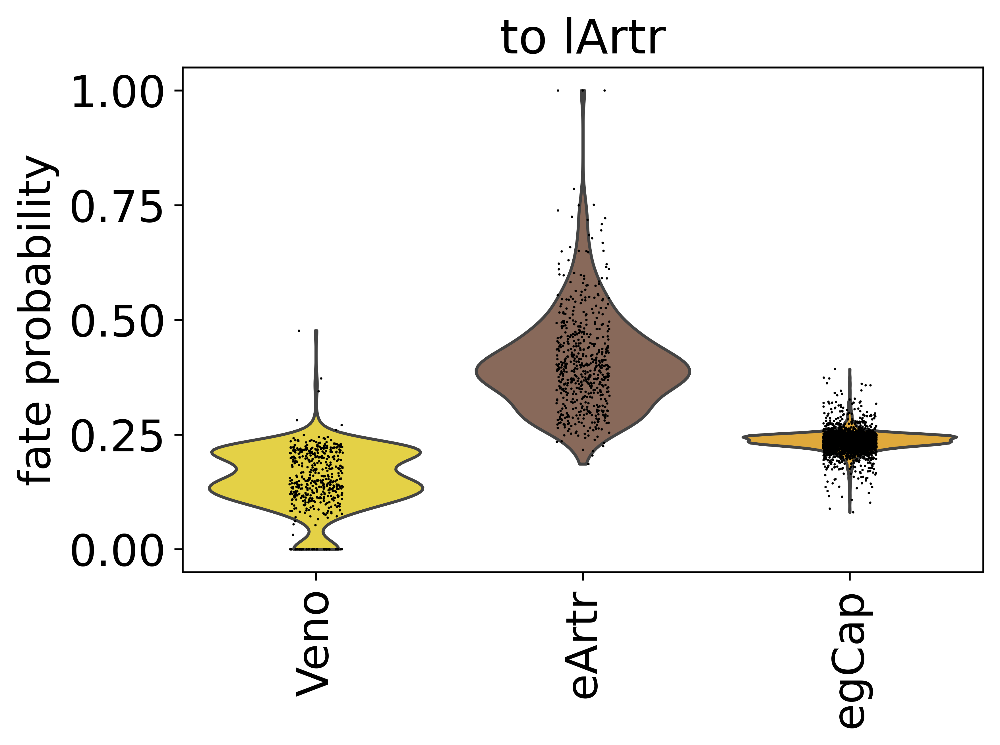

In [42]:
cr.pl.aggregate_fate_probabilities(
    adata, 
    mode="violin", 
    lineages=["lArtr"],
    cluster_key="FineNamedClust", 
    clusters=["egCap", "eArtr", "Veno"],
    dpi=300,
    save="AggregatedFateProb_Violin_lArtr_subclustered.pdf"
)

In [45]:
import pandas
vSMC1_df = g.compute_lineage_drivers(
    lineages=["vSMC1"], cluster_key="FineNamedClust", clusters=["vSMC1", "vSMC2", "ePeri", "lPeri"]
)
vSMC1_df.head(30)
vSMC1_df.to_csv("driver_genes_subclustered/vSMC1_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


In [46]:
vSMC2_df = g.compute_lineage_drivers(
    lineages=["vSMC2"], cluster_key="FineNamedClust", clusters=["vSMC1", "vSMC2", "ePeri", "lPeri"]
)
vSMC2_df.head(30)
vSMC2_df.to_csv("driver_genes_subclustered/vSMC2_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


In [47]:
lPeri_df = g.compute_lineage_drivers(
    lineages=["lPeri_2"], cluster_key="FineNamedClust", clusters=["vSMC1", "vSMC2", "ePeri", "lPeri"]
)
lPeri_df.head(30)
lPeri_df.to_csv("driver_genes_subclustered/lPeri_df_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


In [48]:
# Driver genes across all terminal states
driver_df = g.compute_lineage_drivers()
driver_df.to_csv("driver_genes_subclustered/all_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


ERROR: Please install `adjustText` first as `pip install adjustText`


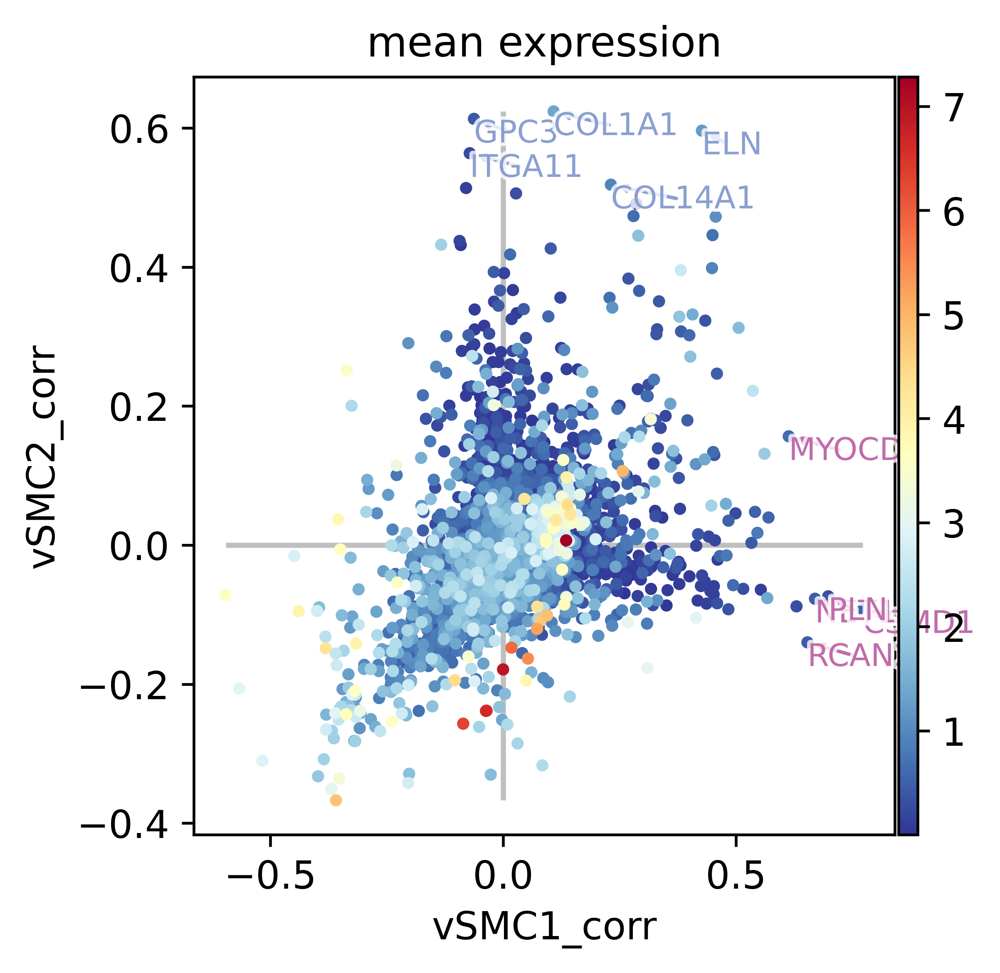

In [49]:
vSMC1_genes=["CSMD1", "PLN", "NET1", "RCAN2", "MYOCD"]
vSMC2_genes=["COL1A1", "GPC3", "ELN", "ITGA11", "COL14A1"]

genes_oi = {
    "vSMC1": vSMC1_genes,
    "vSMC2": vSMC2_genes,
}

# make sure all of these exist in AnnData
assert [
    gene in adata.var_names for genes in genes_oi.values() for gene in genes
], "Did not find all genes"

# compute mean gene expression across all cells
adata.var["mean expression"] = adata.X.A.mean(axis=0)

# visualize in a scatter plot
g.plot_lineage_drivers_correlation(
    lineage_x="vSMC1",
    lineage_y="vSMC2",
    adjust_text=True,
    gene_sets=genes_oi,
    color="mean expression",
    legend_loc="none",
    dpi=300,
    fontsize=9,
    size=50,
    save="vSMC1_vSMC2_meanexpression_scatter_subclustered.pdf"
)

In [49]:
sc.tl.paga(adata, groups="FineNamedClust")

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/networkx/convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, creat

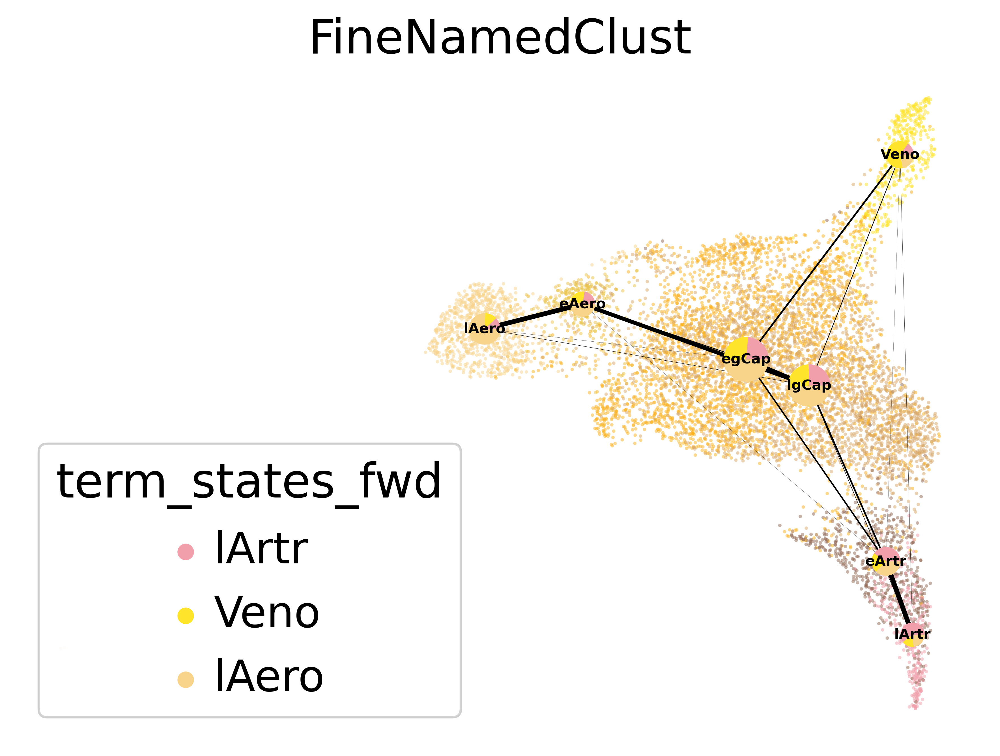

In [51]:
cr.pl.aggregate_fate_probabilities(
    adata,
    mode="paga_pie",
    cluster_key="FineNamedClust",
    basis="umap",dpi=300, figsize=[7,5], fontsize = 6,
    save="paga_pie_subclustered.pdf"
)

In [53]:
# Save anndata object for subclustered Endothelial so far
adata.write_h5ad("01_WOT_Endothelial-Subclustered.h5ad")

In [54]:
import palantir

In [55]:
p_adata=adata

In [56]:
palantir.preprocess.log_transform(p_adata)

In [57]:
# Run diffusion maps
dm_res = palantir.utils.run_diffusion_maps(p_adata, n_components=5)
ms_data = palantir.utils.determine_multiscale_space(p_adata)

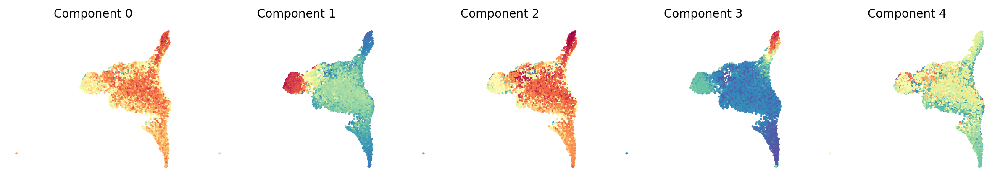

In [58]:
palantir.plot.plot_diffusion_components(p_adata)
plt.show()

In [147]:
# Print cells that could be an early cell
p_adata.obs[(p_adata.obs["FineNamedClust"] == "Veno")]

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,Sample,preservation,...,SCT_snn_res.0.9,BroadClust,BroadNamedClust,sub.cluster,FineClust,FineNamedClust,compartment,PCW,macrostates_fwd,clusters_gradients
PCW12_AAAGGCTCAGCTAATT-1,PCW12,5699.0,2783,5.071065,5699.0,2783,2,26,PCW12,fresh,...,28,26,Veno,26,26,Veno,Endothelial,12,NaN,Veno
PCW12_AATCTTGAGGTAGCTT-1,PCW12,12441.0,4652,3.174986,12441.0,4652,2,26,PCW12,fresh,...,28,26,Veno,26,26,Veno,Endothelial,12,NaN,Veno
PCW12_ACGCCACAGTTGGGCC-1,PCW12,5958.0,2700,6.143001,5958.0,2700,2,26,PCW12,fresh,...,0,26,Veno,26,26,Veno,Endothelial,12,NaN,lgCap
PCW12_AGCTGCTCAATTAAGG-1,PCW12,57850.0,8722,4.504754,57850.0,8722,2,26,PCW12,fresh,...,28,26,Veno,26,26,Veno,Endothelial,12,NaN,Veno
PCW12_AGTAGCTTCAAGGACA-1,PCW12,5036.0,2463,4.686259,5036.0,2463,2,26,PCW12,fresh,...,28,26,Veno,26,26,Veno,Endothelial,12,NaN,Veno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PCW23_TTGCCCGTCATCCTAT-1,PCW23,22087.0,5579,3.653733,22087.0,5579,14,26,PCW23,frozen,...,28,26,Veno,26,26,Veno,Endothelial,23,Veno,Veno
PCW23_TTGTCCCAGTTTGCGG-1,PCW23,3361.0,1752,4.522464,3361.0,1752,14,26,PCW23,frozen,...,28,26,Veno,26,26,Veno,Endothelial,23,NaN,Veno
PCW23_TTTAAGGTCAATAGCC-1,PCW23,4729.0,2090,3.319941,4729.0,2090,14,26,PCW23,frozen,...,28,26,Veno,26,26,Veno,Endothelial,23,NaN,Veno
PCW23_TTTCTCACAAGGTATA-1,PCW23,5519.0,2356,3.823156,5519.0,2356,14,26,PCW23,frozen,...,28,26,Veno,26,26,Veno,Endothelial,23,NaN,Veno


(<Figure size 400x400 with 1 Axes>, <Axes: >)

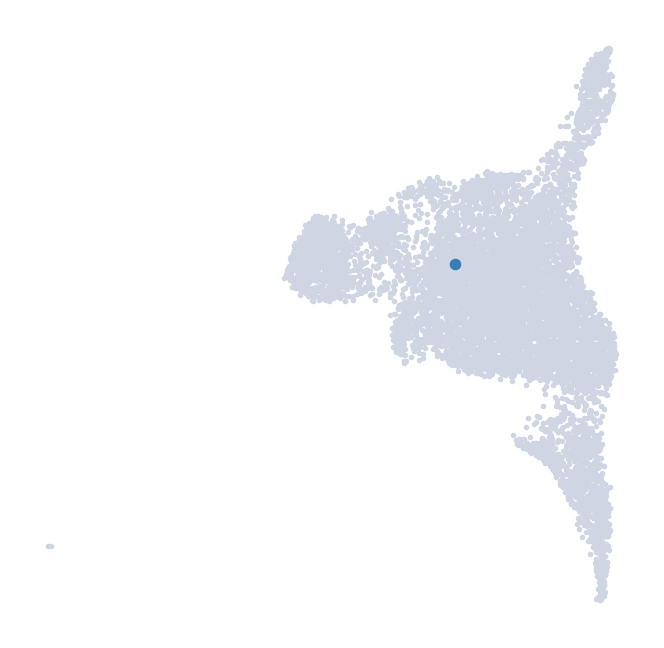

In [144]:
palantir.plot.highlight_cells_on_umap(p_adata, ["PCW23_TTGATGTCACAAAGCG-1"])

In [152]:
import pandas as pd
terminal_states = pd.Series(["lAero", "lArtr", "Veno"],
                           index=["PCW19.LU_AACAGCAAGACACTTA-1","PCW12_AACCGGCTCTTGAGGT-1","PCW14_CAGCCAATCGTTCACC-1"])
start_cell = "PCW23_TTGATGTCACAAAGCG-1"

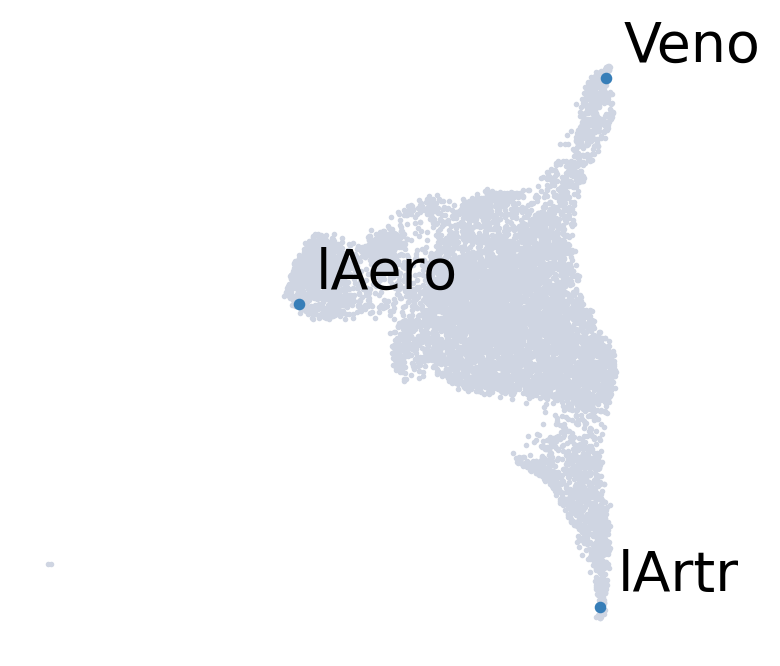

In [153]:
palantir.plot.highlight_cells_on_umap(p_adata, terminal_states)
plt.show()

In [154]:
pr_res = palantir.core.run_palantir(
    p_adata, start_cell, num_waypoints=500, terminal_states=terminal_states
)

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:595: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:604: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


Sampling and flocking waypoints...
Time for determining waypoints: 0.02289424737294515 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:595: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:604: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/traject

Time for shortest paths: 4.164441370964051 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:595: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:604: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/traject

Computing fundamental matrix and absorption probabilities...
Project results to all cells...


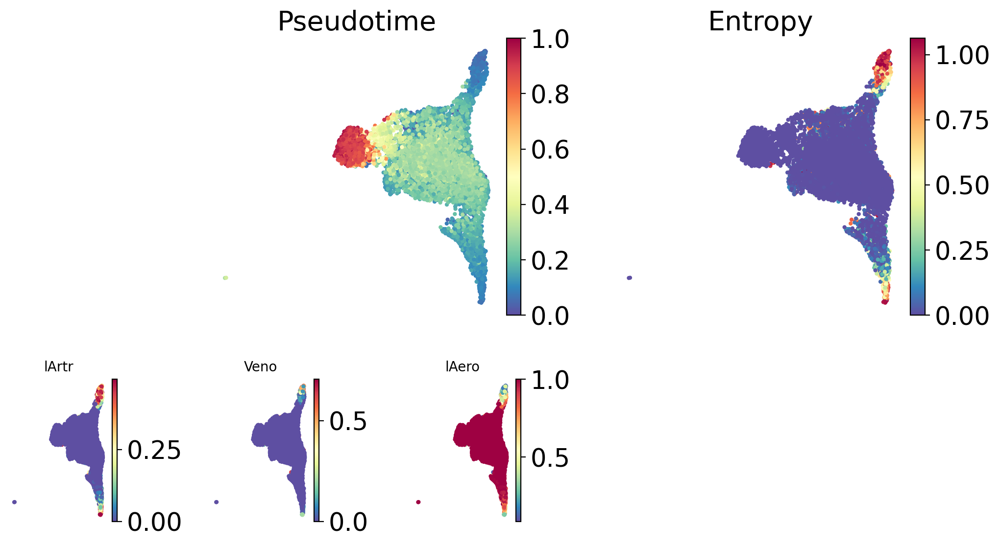

In [155]:
palantir.plot.plot_palantir_results(p_adata, s=4)
plt.show()

In [156]:
masks = palantir.presults.select_branch_cells(p_adata, eps = 0)

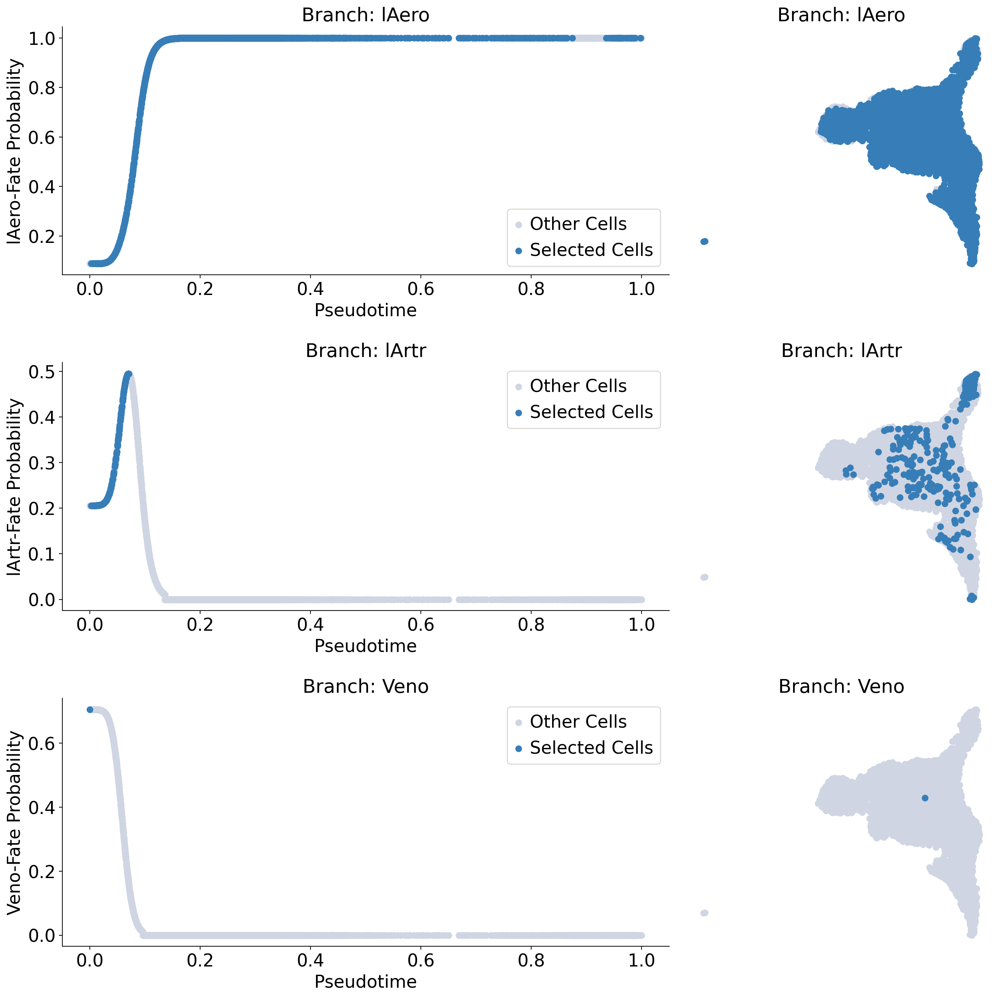

In [157]:
palantir.plot.plot_branch_selection(p_adata)
plt.show()

In [162]:
p_adata

AnnData object with n_obs × n_vars = 8897 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'Sample', 'preservation', 'sex', 'age', 'SCT_snn_res.0.8', 'Clusters', 'S.Score', 'G2M.Score', 'Phase', 'SCT_snn_res.0.6', 'SCT_snn_res.1', 'SCT_snn_res.0.9', 'BroadClust', 'BroadNamedClust', 'sub.cluster', 'FineClust', 'FineNamedClust', 'compartment', 'PCW', 'macrostates_fwd', 'clusters_gradients', 'palantir_pseudotime', 'palantir_entropy'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean expression'
    uns: 'FineNamedClust_colors', 'PCW_colors', 'neighbors', 'hvg', 'schur_matrix_fwd', 'eigendecomposition_fwd', 'macrostates_fwd_colors', 'coarse_fwd', 'clusters_gradients_colors', 'paga', 'FineNamedClust_sizes', 'draw_graph', 'DM_EigenValues', 'palantir_waypoints'
    obsm: 'X_pca', 'X_umap', 'schur_vectors_fw

In [ ]:
p_adata.write_h5ad("01_WOT_Endothelial-Subclustered_Palantir.h5ad")